In [1]:
# Sentiment Analysis Working Notebook

In [2]:
# Master list of all the tickers
ticker_list = ['TSLA', 'ARKK','JNJ','NVDA','XOM']
ticker_sent = {}

In [3]:
# Initial imports
import pandas as pd
from pathlib import Path
import os
from dotenv import load_dotenv
import nltk as nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
get_ipython().run_line_magic("matplotlib", "inline")
analyzer = SentimentIntensityAnalyzer()

import numpy as np
import hvplot.pandas
from numpy.random import seed
seed(1)

%matplotlib inline

from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [20.0, 10.0]

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from string import punctuation
import re

import numpy as np
import holoviews as hv
from fbprophet import Prophet
import hvplot.pandas
import datetime as dt
from numpy import dtype

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/patriciarajamanickam/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!

Bad key text.latex.preview in file /usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 123 ('text.latex.preview : False')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.5.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key mathtext.fallback_to_cm in file /usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 155 ('mathtext.fallback_to_cm : True  # When True, use symbols from the Computer Modern')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.5.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key savefig.jpeg_quality i

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
def get_ticker_news(ticker):
    data_csv_path = Path("Resources/news/" + ticker + ".csv")
    data_df = pd.read_csv(data_csv_path)
    data_df['Date'] = pd.to_datetime(data_df['Date']).dt.date
    data_df = data_df.groupby('Date')['Title', 'Description'].agg(lambda column: ". ".join(column))
    return data_df
    

In [5]:
def get_ticker_price():
    data_csv_path = Path("Resources/prices/close.csv")
    data_df = pd.read_csv(data_csv_path)
    data_df['Date'] = pd.to_datetime(data_df['Date']).dt.date
    data_df = data_df.set_index('Date')
   
    return data_df

In [6]:
# Sentiment calculation based on compound score
def get_sentiment(score):
    """
    Calculates the sentiment based on the compound score.
    """
    result = 0  # Neutral by default
    if score >= 0.05:  # Positive
        result = 1
    elif score <= -0.05:  # Negative
        result = -1

    return result

In [7]:
def get_sentiment_score(ticker):
    data_df = get_ticker_news(ticker)
    data_df = data_df.reset_index()
    title_sent = {
    "title_compound": [],
    "title_pos": [],
    "title_neu": [],
    "title_neg": [],
    "title_sent": [],
    }
    text_sent = {
    "text_compound": [],
    "text_pos": [],
    "text_neu": [],
    "text_neg": [],
    "text_sent": [],
    }

    # Get sentiment for the text and the title
    for index, row in data_df.iterrows():
        try:
            # Sentiment scoring with VADER
            title_sentiment = analyzer.polarity_scores(row["Title"])
            title_sent["title_compound"].append(title_sentiment["compound"])
            title_sent["title_pos"].append(title_sentiment["pos"])
            title_sent["title_neu"].append(title_sentiment["neu"])
            title_sent["title_neg"].append(title_sentiment["neg"])
            title_sent["title_sent"].append(get_sentiment(title_sentiment["compound"]))

            text_sentiment = analyzer.polarity_scores(row["Description"])
            text_sent["text_compound"].append(text_sentiment["compound"])
            text_sent["text_pos"].append(text_sentiment["pos"])
            text_sent["text_neu"].append(text_sentiment["neu"])
            text_sent["text_neg"].append(text_sentiment["neg"])
            text_sent["text_sent"].append(get_sentiment(text_sentiment["compound"]))
        except AttributeError:
            pass

    # Attaching sentiment columns to the News DataFrame
    title_sentiment_df = pd.DataFrame(title_sent)
    text_sentiment_df = pd.DataFrame(text_sent)
    data_df = data_df.join(title_sentiment_df).join(text_sentiment_df)
    data_df = data_df.set_index('Date')
    return data_df
    
    

In [8]:
def get_clean_df():
    # All the closing prices are in single csv, read that
    data_df_close = get_ticker_price()
    data_df_close.head()

    # Get the sentiment of all the tickers
    for ticker in ticker_list:
       data_df = get_sentiment_score(ticker)
       data_df['Close'] = data_df_close[ticker]
       data_df = data_df[['title_compound', 'text_compound', 'Close']]
       data_df = data_df.dropna()
       ticker_sent[ticker] = data_df
    

In [27]:
def get_data_df_trim(ticker, drop_col):
    data_df = ticker_sent[ticker]
    data_df = data_df.drop(columns=drop_col)
    return data_df

In [9]:
nvda_df = get_ticker_news("NVDA")
nvda_df.head()

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


,Title,Description
Date,,
2022-01-02,Top 10 Growth Investing Stocks For 2022. Bitco...,Our preference towards growth investing is to ...
2022-01-03,Downgrading Intel. 3 Surefire Metaverse Stocks...,"After about two quarters into his dream job, C..."
2022-01-04,"Tesla, Apple and This Chipmaker Are Seeing The...",Electric vehicle maker Tesla Inc. (NASDAQ: TSL...
2022-01-05,"Nvidia's Bull Run May Continue, But Micron Is ...",Nvidia (NVDA) and Micron (MU) are 2 semiconduc...
2022-01-06,Nvidia DRIVE Orin Chip To Power Baidu's JiDU R...,U.S. listed Chinese internet giant Baidu Inc (...


In [10]:
# Instantiate the lemmatizer
lemmatizer = WordNetLemmatizer()

# Create a list of stopwords
sw = set(stopwords.words('english'))

# Expand the default stopwords list if necessary
sw_addons = {'say','though','some','wouldn\'t', 'take','all','also','found','still','said','may','since'}

In [11]:
def tokenizer(text,func_overide_param):
    """
    Tokenizes the text
    Second parameter is function overide param utilized to get list of tokens from the text 
    or 
    obtain big string of tokens separated by spaces.
    """
    
    # Remove the punctuation from text
    regex = re.compile("[^a-zA-Z ]")
    re_clean = regex.sub('', text)

    # Create a tokenized list of the words
    words = word_tokenize(re_clean)
    
    
    # Lemmatize words into root words
    lem = [lemmatizer.lemmatize(word) for word in words]
   
    # Convert the words to lowercase
    # Remove the stop words
    tokens = [word.lower() for word in lem if word.lower() not in sw.union(sw_addons)]
    if func_overide_param == 'A':
        return tokens
    else:
        return ' '.join(tokens)
    

In [12]:
def ticker_wordcloud(ticker):
    df = get_ticker_news(ticker)
    title_string = ' '.join(df['Title'])
    title_tokens_string = tokenizer(title_string,'B')
    title_wc = WordCloud().generate(title_tokens_string)
    
    return plt.imshow(title_wc)

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


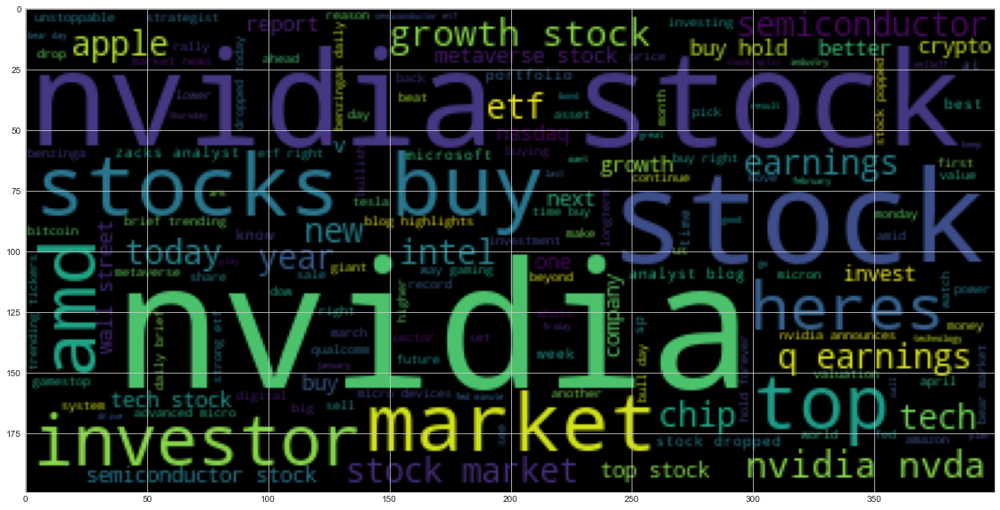

In [13]:
nvda_wc = ticker_wordcloud("NVDA")
plt.savefig(Path("Images/NVDA.png"))

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


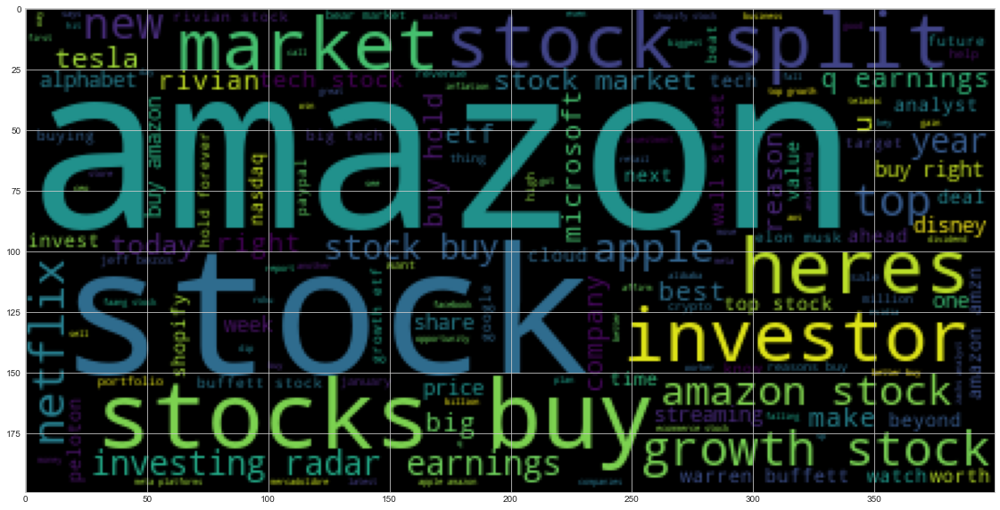

In [14]:
amzn_wc = ticker_wordcloud("AMZN")
plt.savefig(Path("Images/AMZN.png"))

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


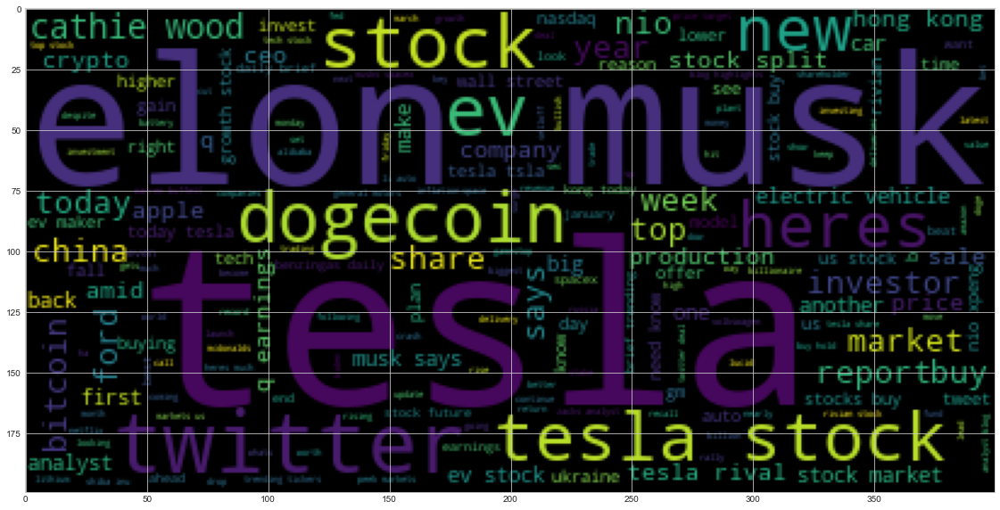

In [15]:
tsla_wc = ticker_wordcloud("TSLA")
plt.savefig(Path("Images/TSLA.png"))

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


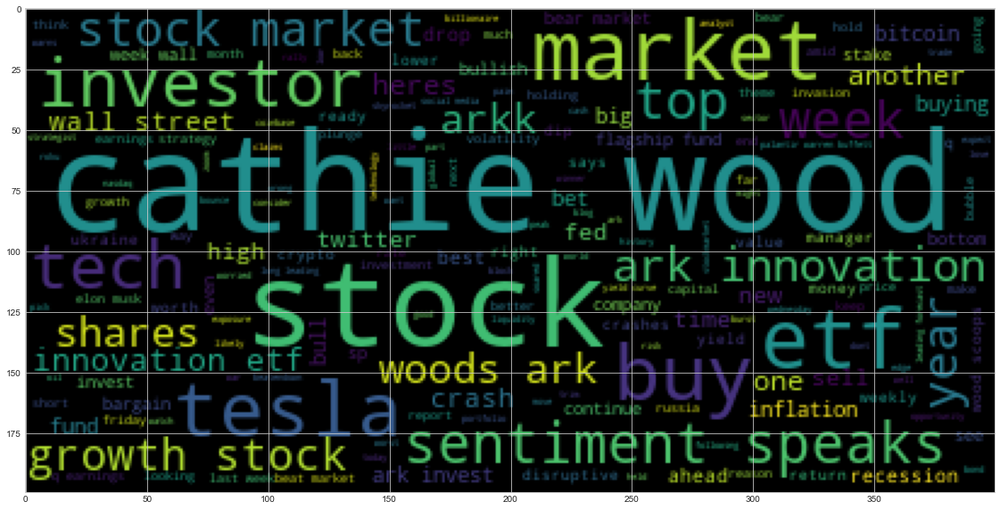

In [16]:
arkk_wc = ticker_wordcloud("ARKK")
plt.savefig(Path("Images/ARKK.png"))

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


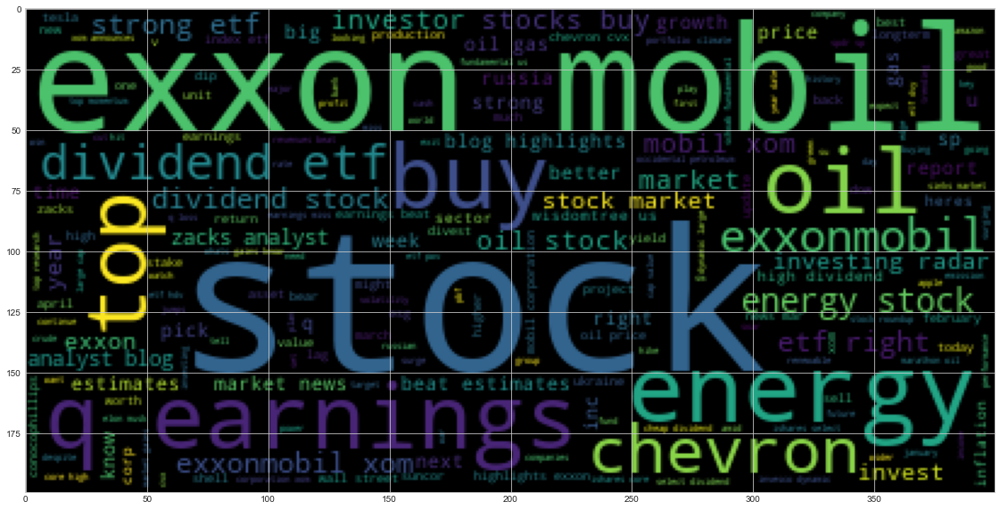

In [17]:
xom_wc = ticker_wordcloud("XOM")
plt.savefig(Path("Images/XOM.png"))

/usr/local/anaconda3/envs/project2env/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


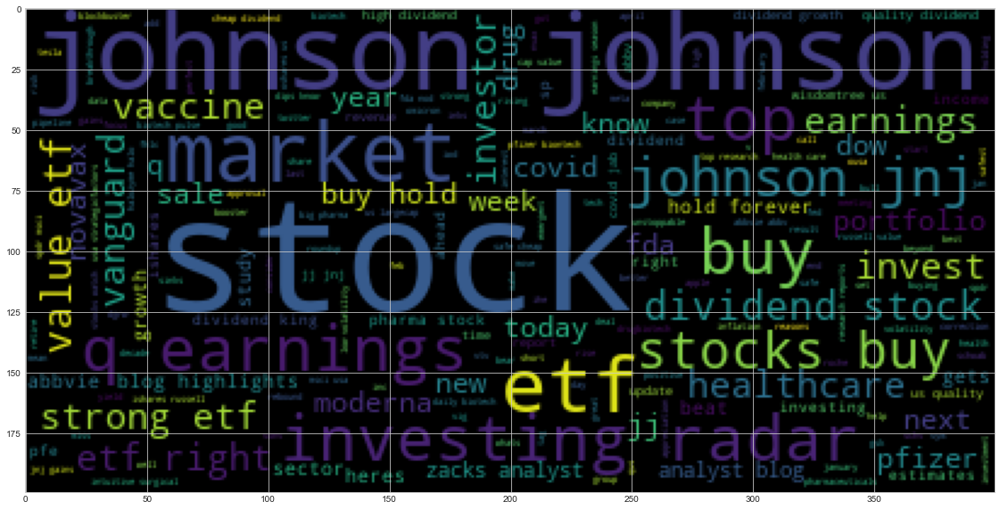

In [18]:
jnj_wc = ticker_wordcloud("JNJ")
plt.savefig(Path("Images/JNJ.png"))

In [30]:
tsla_df = get_data_df_trim("TSLA","Description")

KeyError: 'TSLA'